# CaloChallenge 2022 - Dataset Loading and Usage

In [1]:
# imports
from HighLevelFeatures import HighLevelFeatures as HLF
import numpy as np
import h5py
import matplotlib.pyplot as plt

All 3 datasets have a similar structure and the helper functions are designed to work on all of them. Below are a few examples on how to load and access the data, compute and plot high-level features, and look at average/individual showers for each dataset. 

## Dataset 1

In [2]:
# creating instance of HighLevelFeatures class to handle geometry based on binning file
HLF_1_photons = HLF('photon', filename='binning_dataset_1_photons.xml')
HLF_1_pions = HLF('pion', filename='binning_dataset_1_pions.xml')

In [3]:
# loading the .hdf5 datasets
photon_file = h5py.File('../dataset_1_photons_1.hdf5', 'r')
pion_file = h5py.File('../dataset_1_pions_1.hdf5', 'r')

In [4]:
# each file contains one dataset for the incident energy and one for the showers.
for dataset in photon_file:
    # name of the datasets:
    print("dataset name: ", dataset)
    print("dataset shape:", photon_file[dataset][:].shape)
print('\n')
for dataset in pion_file:
    # name of the datasets:
    print("dataset name: ", dataset)
    print("dataset shape:", pion_file[dataset][:].shape)


dataset name:  incident_energies
dataset shape: (121000, 1)
dataset name:  showers
dataset shape: (121000, 368)


dataset name:  incident_energies
dataset shape: (120230, 1)
dataset name:  showers
dataset shape: (120230, 533)


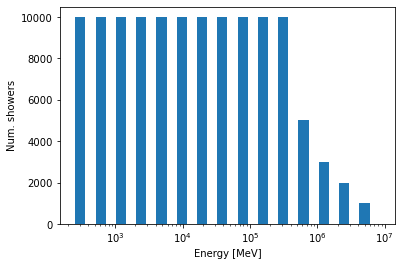

In [5]:
# incident energies are discrete, starting at 256 MeV and increasing in powers of 2. At high energies,
# there are fewer than 10k events per energy 
energies = photon_file['incident_energies'][:]

bins = np.logspace(8,23,31, base=2)
plt.hist(energies, bins=bins)
plt.xscale('log')
plt.xlabel('Energy [MeV]')
plt.ylabel('Num. showers')
plt.show()

In [6]:
# High-level features are computed once for a given dataset by calling EvaluateFeatures(showers)
HLF_1_photons.CalculateFeatures(photon_file["showers"][:])
HLF_1_pions.CalculateFeatures(pion_file["showers"][:])

# and can then be given out like this:

# total deposited energy in the shower
print("Total energy of each photon shower: ", HLF_1_photons.GetEtot())
print("Average total energy of the pion showers: ", HLF_1_pions.GetEtot().mean())

# ratio of deposited and incident energy
print("Average of deposited over incident energies: ", (HLF_1_photons.GetEtot()/photon_file['incident_energies'][:].squeeze()).mean())


# energy deposited in each layer of the geometry:
# (returns a dict with layer_number as key. Note that the ATLAS geometry has fewer relevant layer than are totally
# available, the 5th layer of the photons therefore has layer_number 12)
print("Energy deposited in each layer for each photon shower: ", HLF_1_photons.GetElayers())
print("Average energy deposited in the first layer for pion showers: ", HLF_1_pions.GetElayers()[0].mean())
print("Average energy deposited in the last layer for pion showers: ", HLF_1_pions.GetElayers()[14].mean())


# Center of energy in eta direction:
# (only available for layer with more than one alpha bin)
print("Center of energy in eta direction for each photon shower: ", HLF_1_photons.GetECEtas())
# and its width
print("Width of center of energy in eta direction for each photon shower: ", HLF_1_photons.GetWidthEtas())

# Center of energy in phi direction:
# (only available for layer with more than one alpha bin)
print("Center of energy in phi direction for each pion shower: ", HLF_1_pions.GetECPhis())
# and its width
print("Width of center of energy in phi direction for each pion shower: ", HLF_1_pions.GetWidthEtas())


Total energy of each photon shower:  [  1804.58370525    526.07162701    269.07073851 ... 256502.587781
    353.868214   254979.106397  ]
Average total energy of the pion showers:  114709.80996277733
Average of deposited over incident energies:  0.9681129672733975
Energy deposited in each layer for each photon shower:  {0: array([  93.911066 ,    0.       ,    0.       , ..., 1127.91346  ,
         87.7463589,  757.17673  ]), 1: array([9.58924410e+02, 1.41544053e+02, 2.65372564e+01, ...,
       4.55370981e+04, 2.46801590e+02, 3.82008977e+04]), 2: array([7.50893627e+02, 3.84527574e+02, 2.42533482e+02, ...,
       2.08542926e+05, 1.93202654e+01, 2.14681755e+05]), 3: array([8.54602000e-01, 0.00000000e+00, 0.00000000e+00, ...,
       9.06427250e+02, 0.00000000e+00, 8.68508301e+02]), 12: array([  0.    ,   0.    ,   0.    , ..., 388.2228,   0.    , 470.7685])}
Average energy deposited in the first layer for pion showers:  373.9922200250379
Average energy deposited in the last layer for pion

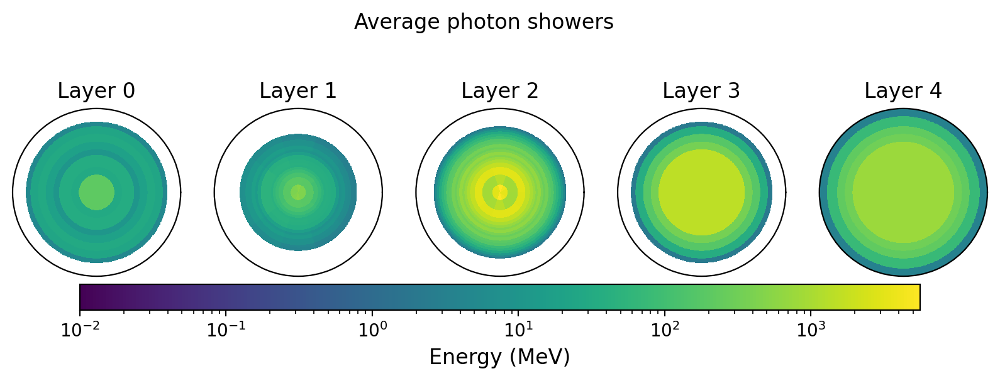

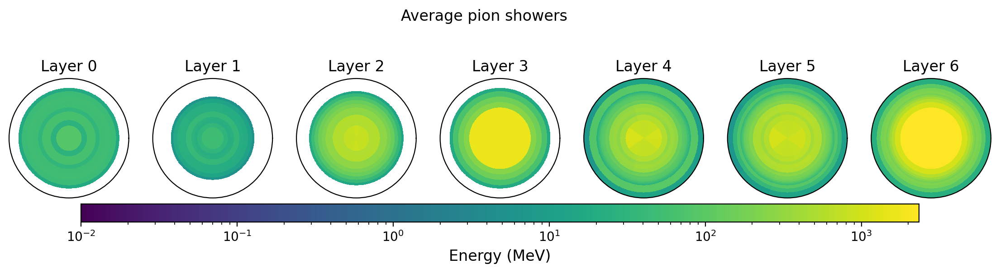

In [7]:
# looking at the average shower:
# not providing a filename or passing 'None' does not save the plot
# functions return instance of matplotlib.pyplot.figure
_ = HLF_1_photons.DrawAverageShower(photon_file['showers'][:], filename=None, title="Average photon showers")
_ = HLF_1_pions.DrawAverageShower(pion_file['showers'][:], title="Average pion showers")

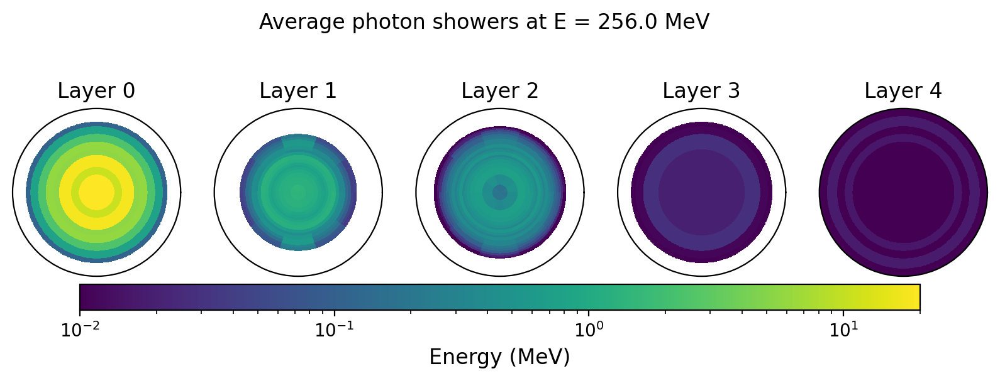

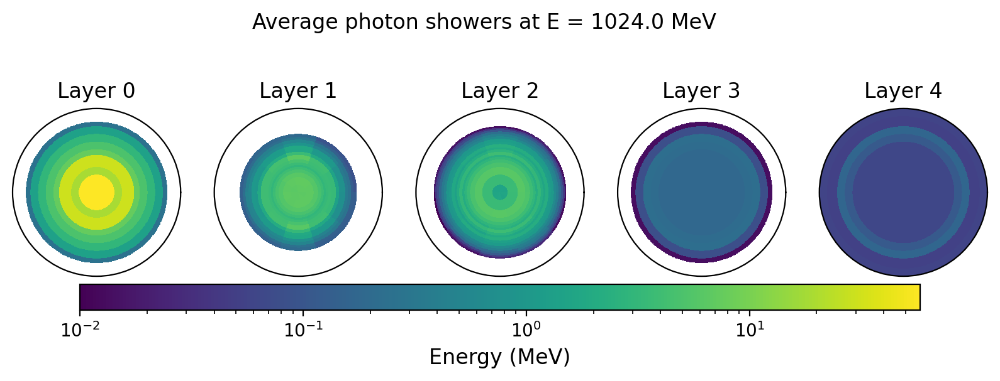

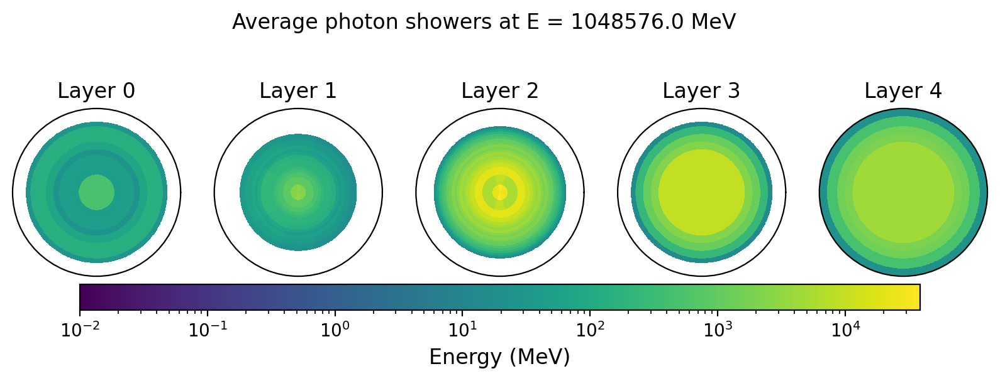

In [8]:
# averages at fixed energies:

for energy in [256., 1024., 1048576.]:
    voxel_dim = photon_file['showers'].shape[1]
    # hdf5 indexing must match the shape of the dataset:
    energy_idx = np.tile(photon_file['incident_energies'][:]==energy, voxel_dim)
    # and then be reshaped:
    _ = HLF_1_photons.DrawAverageShower(photon_file['showers'][energy_idx].reshape(-1, voxel_dim), 
                                        filename=None, title="Average photon showers at E = {} MeV".format(energy))

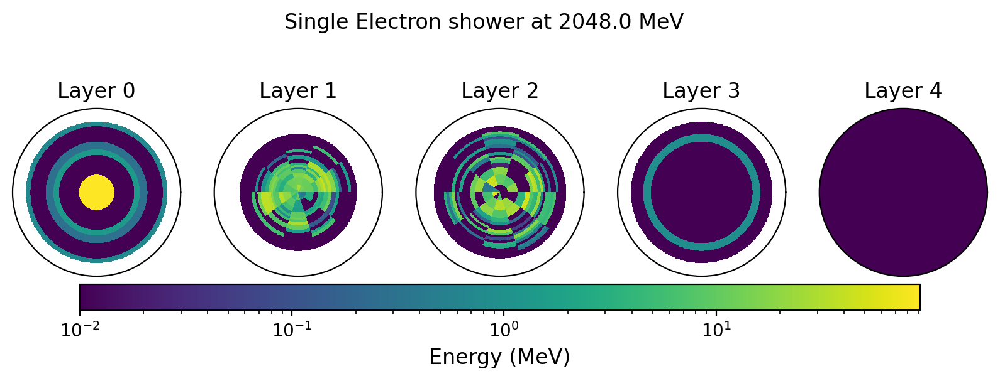

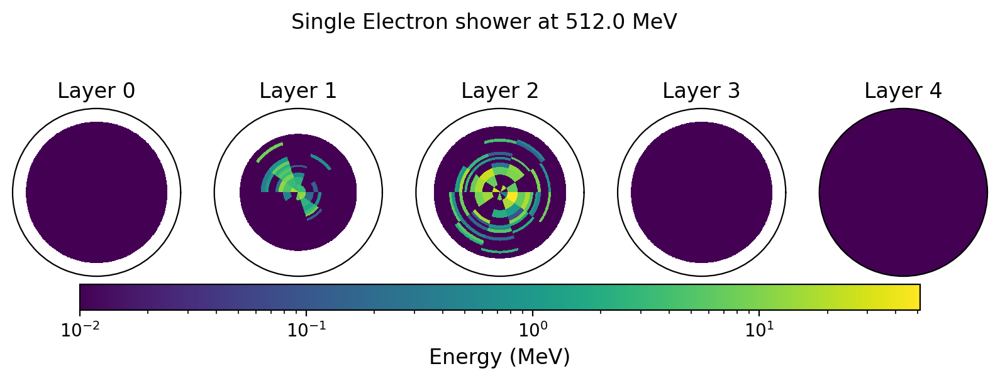

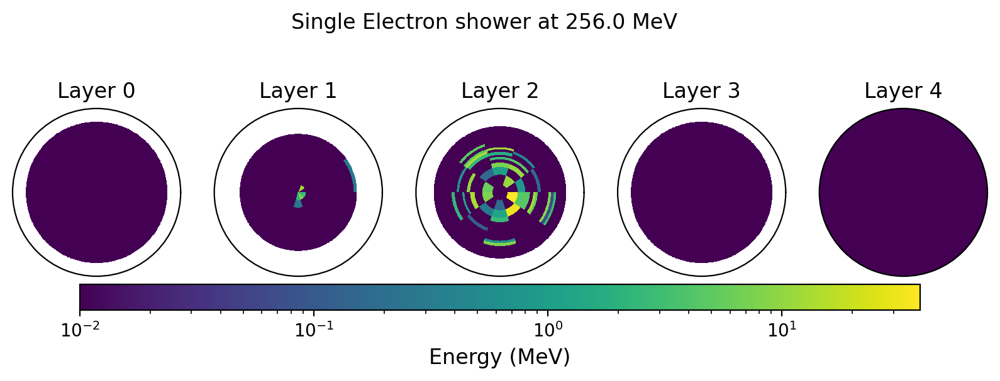

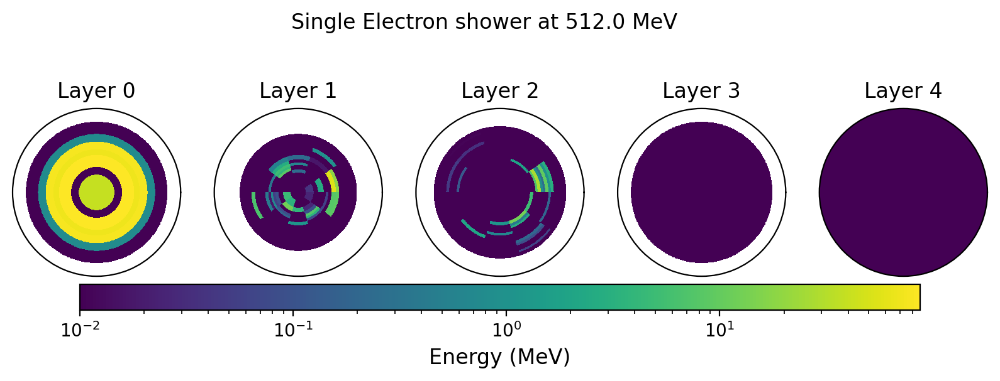

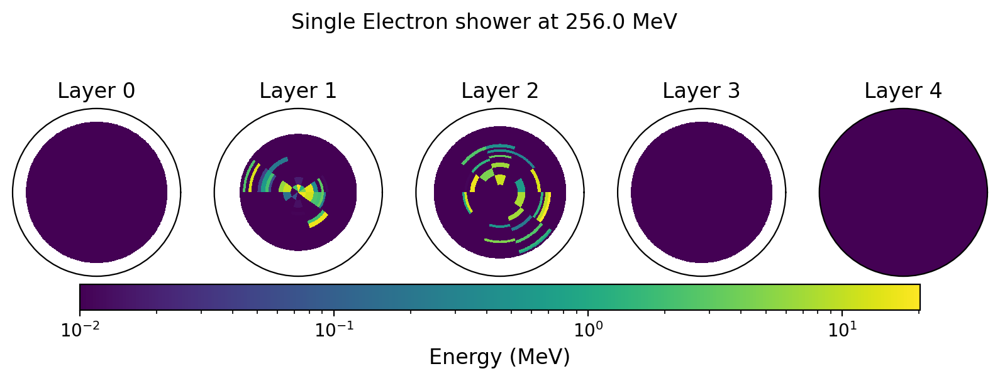

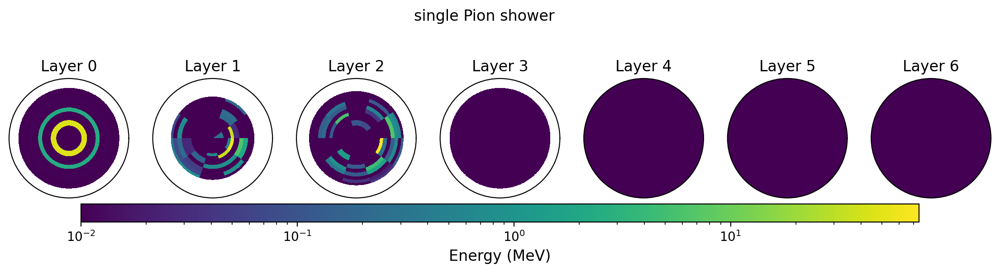

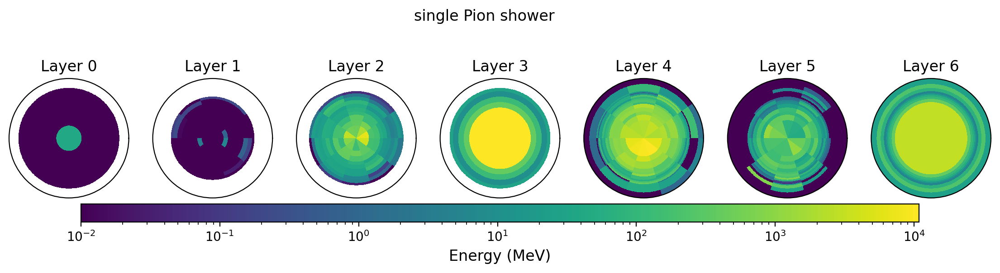

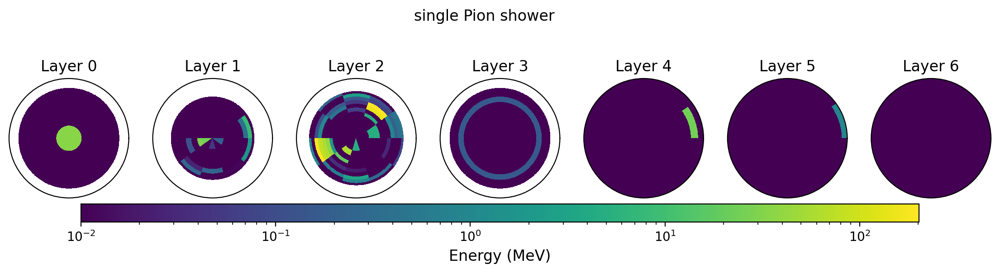

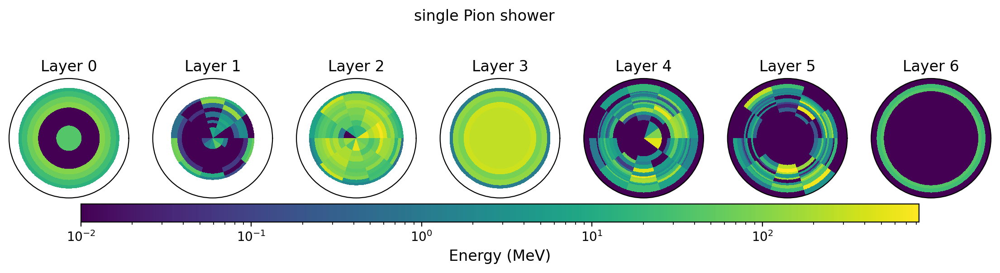

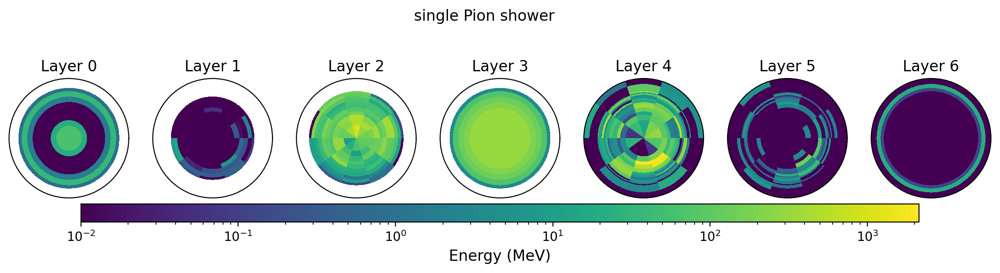

In [9]:
# looking at the first 5 showers:
# not providing a filename or passing 'None' does not save the plot
# functions return instance of matplotlib.pyplot.figure
# DrawSingleShower supports passing of multiple showers, but the will all get the same title
# passing a single shower allows individual titles
for i in range(5):
    _ = HLF_1_photons.DrawSingleShower(photon_file['showers'][i], filename=None, 
                                title="Single Electron shower at {:.1f} MeV".format(photon_file['incident_energies'][i][0]))

_ = HLF_1_pions.DrawSingleShower(pion_file['showers'][:5],
                                title="single Pion shower")


## Dataset 2

In [11]:
# creating instance of HighLevelFeatures class to handle geometry based on binning file
HLF_2 = HLF('electron', filename='binning_dataset_2.xml')

In [12]:
# loading the .hdf5 dataset
electron_file = h5py.File('../dataset_2_1.hdf5', 'r') # or dataset_2_2.hdf5

In [13]:
for dataset in electron_file:
    # name of the datasets:
    print("dataset name: ", dataset)
    print("dataset shape:", electron_file[dataset].shape)


dataset name:  incident_energies
dataset shape: (100000, 1)
dataset name:  showers
dataset shape: (100000, 6480)


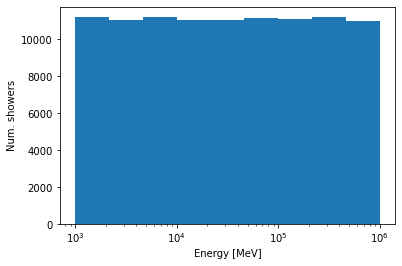

In [14]:
# incident energies are flat in logarithmic space between 1 GeV and 1 TeV:
energies = electron_file['incident_energies'][:]
showers = electron_file["showers"][:]

bins = np.logspace(3,6,10)
plt.hist(energies, bins=bins)
plt.xscale('log')
plt.xlabel('Energy [MeV]')
plt.ylabel('Num. showers')
plt.show()

In [15]:
# High-level features are computed once for a given dataset by calling EvaluateFeatures(data)
HLF_2.CalculateFeatures(showers)

In [16]:
# and can then be given out like this:

# total deposited energy in the shower
print("Total energy of each shower: ", HLF_2.GetEtot())
print("Average of deposited over incident energies: ", (HLF_2.GetEtot()/energies.squeeze()).mean())



# energy deposited in each layer of the geometry:
# (returns a dict with layer_number as key.
print("Energy deposited in each layer for each shower: ", HLF_2.GetElayers())
print("Average energy deposited in the first layer: ", HLF_2.GetElayers()[0].mean())
print("Average energy deposited in the last layer: ", HLF_2.GetElayers()[44].mean())


# Center of energy in eta direction:
# (only available for layer with more than one alpha bin)
print("Center of energy in eta direction for each shower: ", HLF_2.GetECEtas())
# and its width
print("Width of center of energy in eta direction for each shower: ", HLF_2.GetWidthEtas())

# Center of energy in phi direction:
# (only available for layer with more than one alpha bin)
print("Center of energy in phi direction for each shower: ", HLF_2.GetECPhis())
# and its width
print("Width of center of energy in phi direction for each shower: ", HLF_2.GetWidthEtas())

Total energy of each shower:  [ 94183.4972092  551609.30982837   1780.23760363 ... 543395.31405528
 116978.01709352   5117.22302396]
Average of deposited over incident energies:  0.7840088654371862
Energy deposited in each layer for each shower:  {0: array([ 620.4003196 ,  473.22088204,   32.49388772, ...,  490.33394425,
        222.58180971, 1020.8111331 ]), 1: array([ 808.44083312, 1361.73827929,  148.83591469, ..., 1381.02350495,
        636.11705161,  215.20776573]), 2: array([1790.75530563, 2551.18190612,   36.74599551, ..., 2701.981948  ,
       1194.72596797,  297.46919684]), 3: array([3513.62428425, 5706.42575967,   64.09922502, ..., 6026.14651887,
       2350.41051014,  321.52661169]), 4: array([ 4822.78929948,  7439.7822533 ,   103.32692268, ...,
       11308.52711526,  2966.00086995,   316.07635376]), 5: array([ 5175.01081193, 13692.81076648,    91.6321077 , ...,
       16364.12344879,  5344.92834634,   308.79759071]), 6: array([ 6471.8702457 , 16726.45703866,   168.22668317

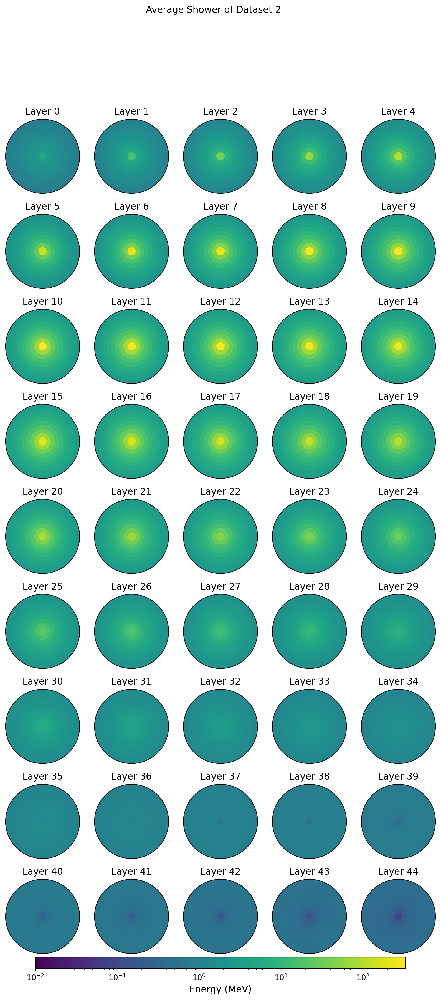

In [17]:
# looking at the average shower:
# not providing a filename or passing 'None' does not save the plot
# functions return instance of matplotlib.pyplot.figure
_ = HLF_2.DrawAverageShower(showers, filename=None, title="Average Shower of Dataset 2")

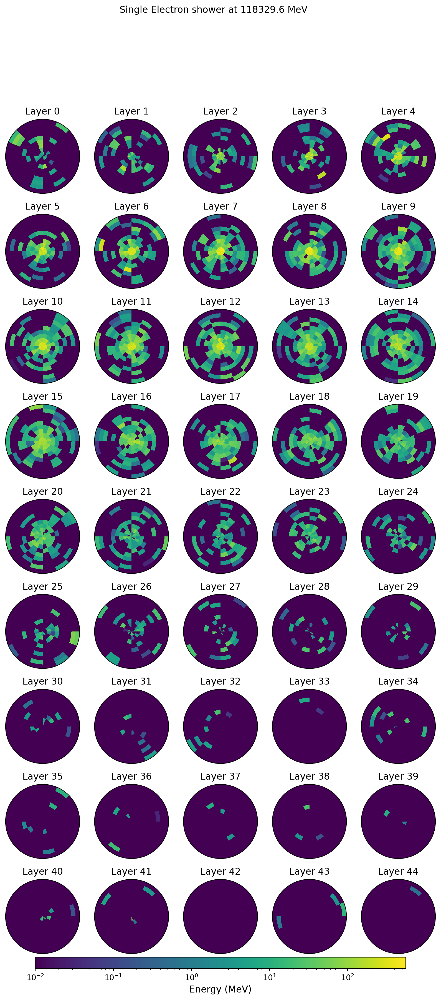

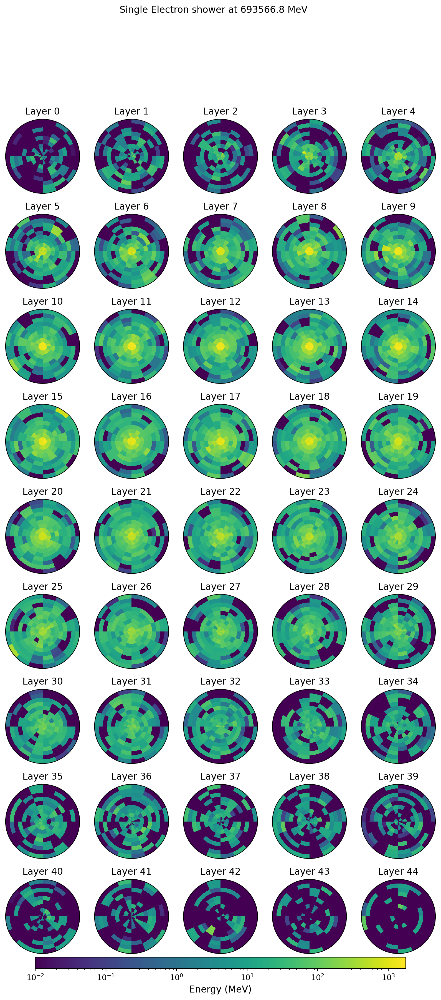

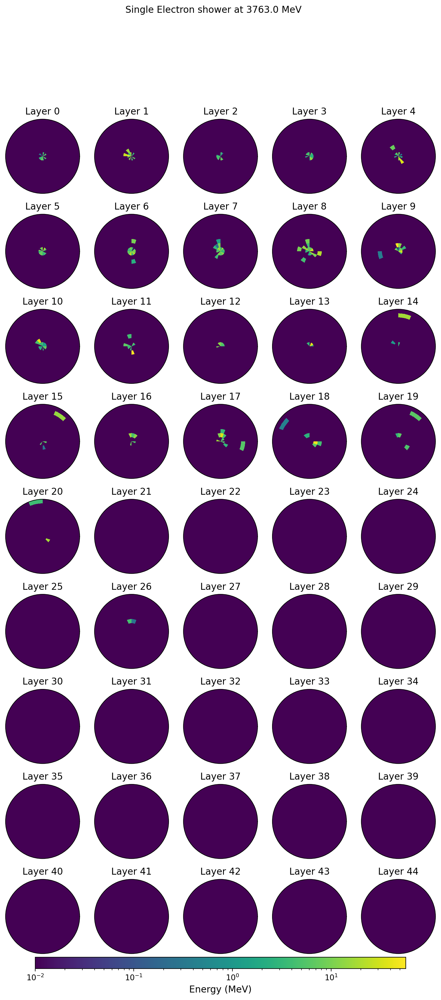

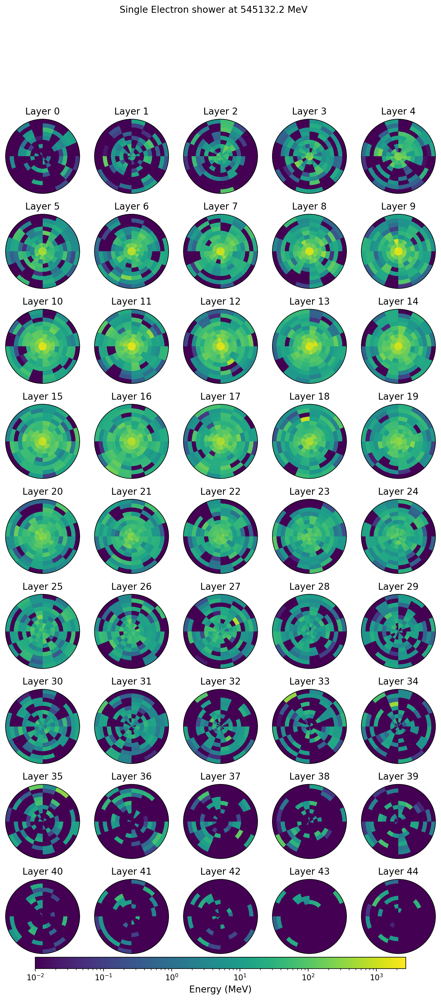

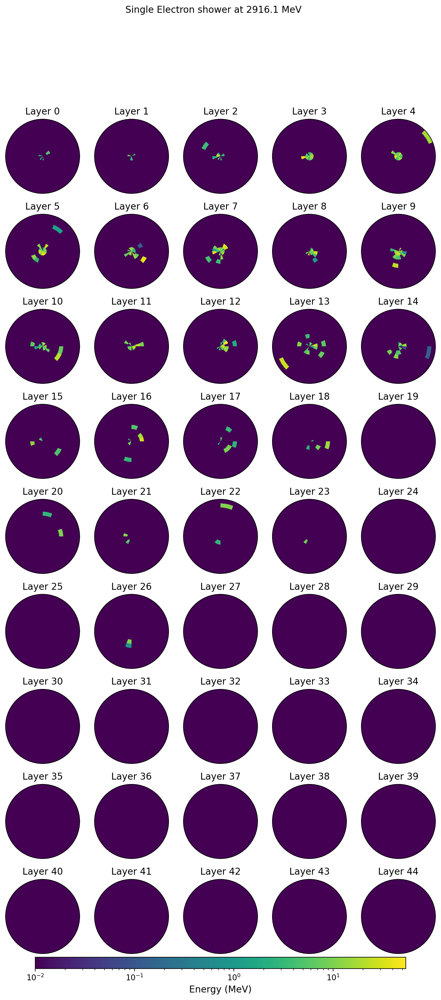

In [18]:
# looking at the first 5 showers:
# not providing a filename or passing 'None' does not save the plot
# functions return instance of matplotlib.pyplot.figure
# DrawSingleShower supports passing of multiple showers, but the will all get the same title
# passing a single shower allows individual titles
for i in range(5):
    _ = HLF_2.DrawSingleShower(showers[i], filename=None, 
                                title="Single Electron shower at {:.1f} MeV".format(energies[i][0]))


## Dataset 3

In [20]:
# creating instance of HighLevelFeatures class to handle geometry based on binning file
HLF_3 = HLF('electron', filename='binning_dataset_3.xml')

In [21]:
# loading the .hdf5 dataset
electron_file = h5py.File('../dataset_3_1.hdf5', 'r') # or dataset_3_i.hdf5 with i in [1,2,3,4,5,6]

In [22]:
for dataset in electron_file:
    # name of the datasets:
    print("dataset name: ", dataset)
    print("dataset shape:", electron_file[dataset].shape)

dataset name:  incident_energies
dataset shape: (50000, 1)
dataset name:  showers
dataset shape: (50000, 40500)


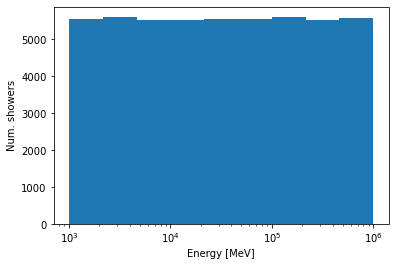

In [23]:
# incident energies are flat in logarithmic space between 1 GeV and 1 TeV:
energies = electron_file['incident_energies'][:]
showers = electron_file["showers"][:]

bins = np.logspace(3,6,10)
plt.hist(energies, bins=bins)
plt.xscale('log')
plt.xlabel('Energy [MeV]')
plt.ylabel('Num. showers')
plt.show()

In [24]:
# High-level features are computed once for a given dataset by calling EvaluateFeatures(data)
HLF_3.CalculateFeatures(showers)

In [25]:
# and can then be given out like this:

# total deposited energy in the shower
print("Total energy of each shower: ", HLF_3.GetEtot())
print("Average of deposited over incident energies: ", (HLF_3.GetEtot()/energies.squeeze()).mean())



# energy deposited in each layer of the geometry:
# (returns a dict with layer_number as key.
print("Energy deposited in each layer for each shower: ", HLF_3.GetElayers())
print("Average energy deposited in the first layer: ", HLF_3.GetElayers()[0].mean())
print("Average energy deposited in the last layer: ", HLF_3.GetElayers()[44].mean())


# Center of energy in eta direction:
# (only available for layer with more than one alpha bin)
print("Center of energy in eta direction for each shower: ", HLF_3.GetECEtas())
# and its width
print("Width of center of energy in eta direction for each shower: ", HLF_3.GetWidthEtas())

# Center of energy in phi direction:
# (only available for layer with more than one alpha bin)
print("Center of energy in phi direction for each shower: ", HLF_3.GetECPhis())
# and its width
print("Width of center of energy in phi direction for each shower: ", HLF_3.GetWidthEtas())

Total energy of each shower:  [708470.5811004   31395.00036422 146680.83021166 ... 239992.4937485
 143184.02838876 604302.85062643]
Average of deposited over incident energies:  0.783775147517988
Energy deposited in each layer for each shower:  {0: array([892.03020603, 138.76289486, 228.9077395 , ..., 778.68846639,
       327.098275  , 526.82841064]), 1: array([1592.66562195,  263.25155521,  637.01282279, ..., 1874.5638651 ,
        751.62891505, 1226.34616094]), 2: array([2538.65451787,  728.04820266, 1231.81027792, ..., 2256.64831976,
       1978.12485496, 3146.09215871]), 3: array([6274.13920136, 1105.06113065, 3039.80644688, ..., 3659.540377  ,
       2725.82329371, 5671.00129178]), 4: array([10429.36280715,  1670.51223232,  4990.03161253, ...,
        7172.33902433,  5222.50052714,  8587.26422208]), 5: array([17238.05938772,  1346.92719636,  7766.0916275 , ...,
       10718.22375121,  9762.04934398, 14583.69579591]), 6: array([23476.30530534,  1777.6090682 ,  8251.96446536, ...,
 

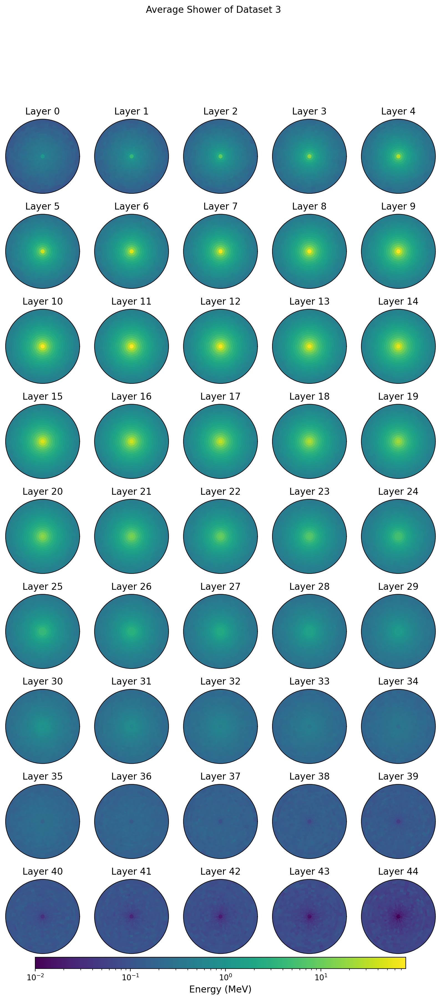

In [26]:
# looking at the average shower:
# not providing a filename or passing 'None' does not save the plot
# functions return instance of matplotlib.pyplot.figure
_ = HLF_3.DrawAverageShower(showers, filename=None, title="Average Shower of Dataset 3")

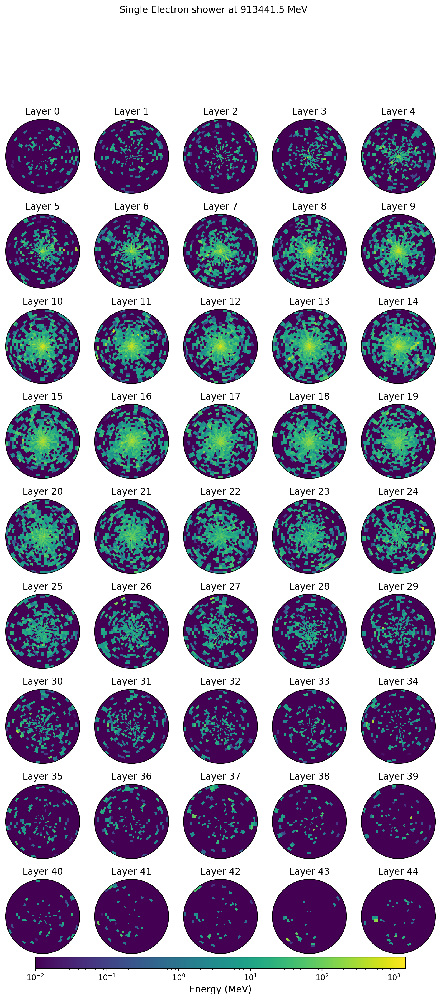

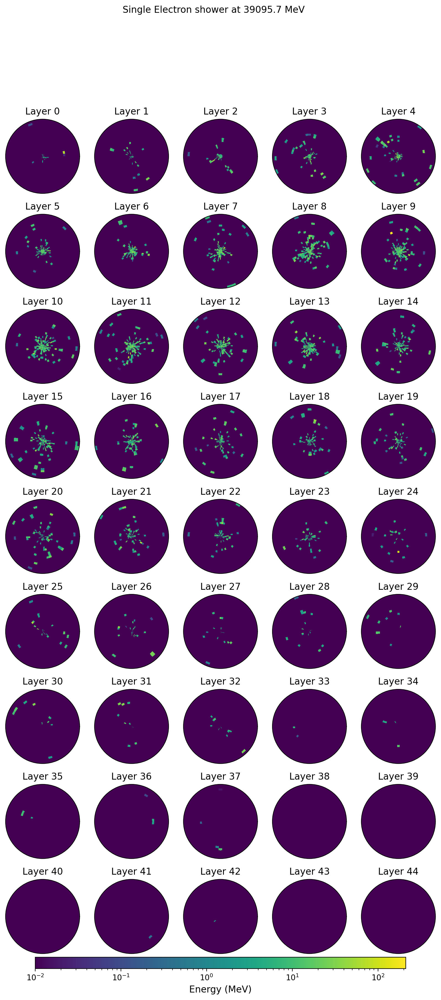

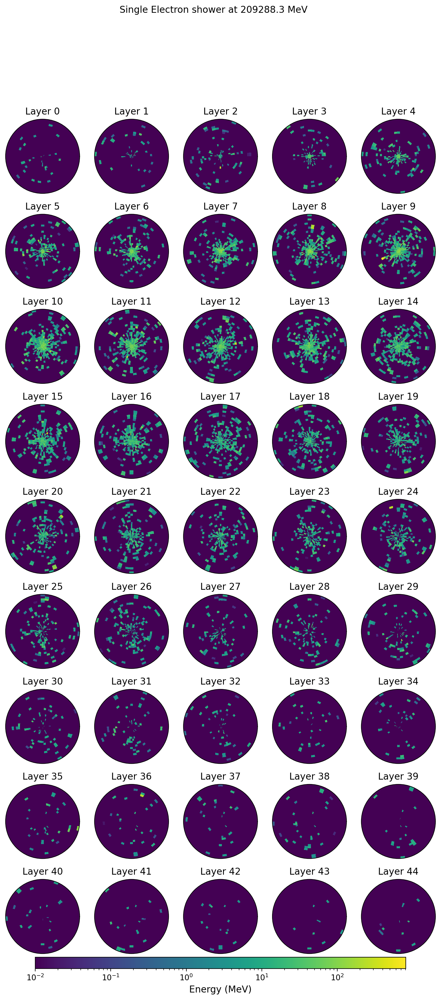

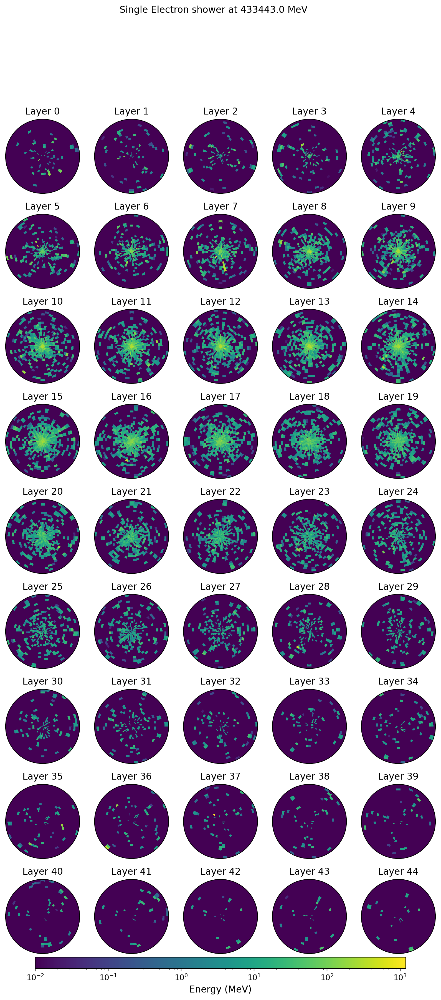

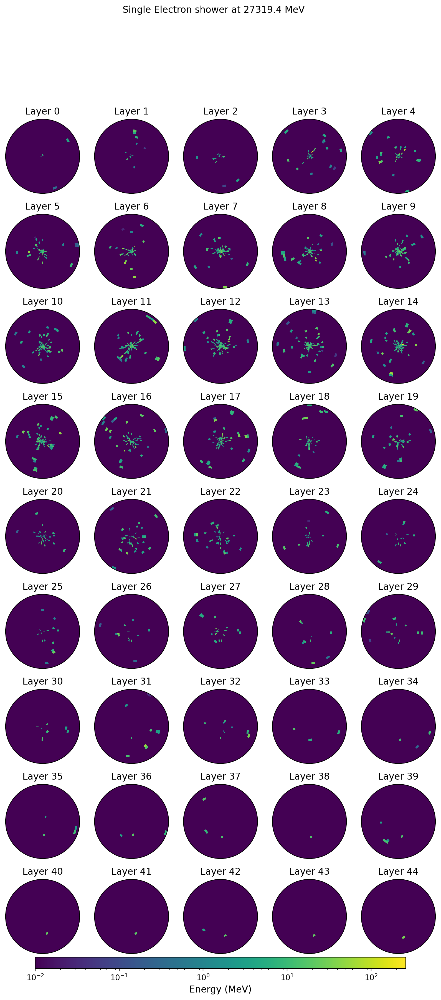

In [27]:
# looking at the first 5 showers:
# not providing a filename or passing 'None' does not save the plot
# functions return instance of matplotlib.pyplot.figure
# DrawSingleShower supports passing of multiple showers, but the will all get the same title
# passing a single shower allows individual titles
for i in range(5):
    _ = HLF_3.DrawSingleShower(showers[i], filename=None, 
                                title="Single Electron shower at {:.1f} MeV".format(energies[i][0]))
